## Step 0: Installation and Setup

First, let's install all required libraries. This might take a few minutes.

In [ ]:
# Install required packages from requirements.txt

In [ ]:
# Import all necessary libraries
import warnings
warnings.filterwarnings('ignore')

# Core libraries
import numpy as np
import pandas as pd
from pathlib import Path
from typing import List, Dict, Tuple
import subprocess
from datetime import timedelta

# Audio/Video processing
import whisper
import yt_dlp
import librosa
import soundfile as sf

# ML/AI libraries
import torch
from sentence_transformers import SentenceTransformer
import chromadb
from chromadb.utils.embedding_functions import SentenceTransformerEmbeddingFunction
from transformers import AutoProcessor, AutoModel
from PIL import Image

# Visualization
import matplotlib.pyplot as plt
import plotly.express as p
import plotly.graph_objects as go
from IPython.display import display, HTML, Audio, Video
import ipywidgets as widgets
from sklearn.manifold import TSNE

# Create directories for our work
WORK_DIR = Path("workshop_data")
WORK_DIR.mkdir(exist_ok=True)
print(f"📁 Working directory: {WORK_DIR.absolute()}")

🎯 Using device: mps
🔧 PyTorch version: 2.8.0
📁 Working directory: /Users/paras.mehta/Projects/hpi/transcription/code/video-search/learning-materials/workshop_data


## Step 1: Video/Audio Acquisition

Let's download our sample video about wildlife and a pond. This video is perfect because it has:
- Clear narration
- Visual content (wildlife scenes)
- Multiple topics (seasons, animals, pond construction)

In [2]:
# Video URL - Wildlife pond documentary
VIDEO_URL = "https://youtu.be/huGT0zW-YB4"
VIDEO_ID = "huGT0zW-YB4"

def download_video(url: str, output_dir: Path) -> Tuple[str, str]:
    """Download video and extract audio using yt-dlp"""
    
    video_path = output_dir / f"{VIDEO_ID}.mp4"
    audio_path = output_dir / f"{VIDEO_ID}.mp3"
    
    # Check if already downloaded
    if video_path.exists() and audio_path.exists():
        print("✅ Video and audio already downloaded")
        return str(video_path), str(audio_path)
    
    print("📥 Downloading video...")
    ydl_opts = {
        'format': 'best[ext=mp4]/best',
        'outtmpl': str(video_path),
        'quiet': True,
        'no_warnings': True,
    }
    
    with yt_dlp.YoutubeDL(ydl_opts) as ydl:
        info = ydl.extract_info(url, download=True)
        print(f"📹 Video title: {info.get('title', 'Unknown')}")
        print(f"⏱️ Duration: {info.get('duration', 0)} seconds")
    
    # Extract audio using ffmpeg
    print("🎵 Extracting audio...")
    cmd = [
        'ffmpeg', '-i', str(video_path),
        '-vn', '-acodec', 'mp3', '-ab', '192k',
        '-y', str(audio_path)
    ]
    subprocess.run(cmd, capture_output=True, text=True)
    
    print("✅ Download complete!")
    return str(video_path), str(audio_path)

# Download the video
video_file, audio_file = download_video(VIDEO_URL, WORK_DIR)

✅ Video and audio already downloaded


📊 Loading audio for visualization...


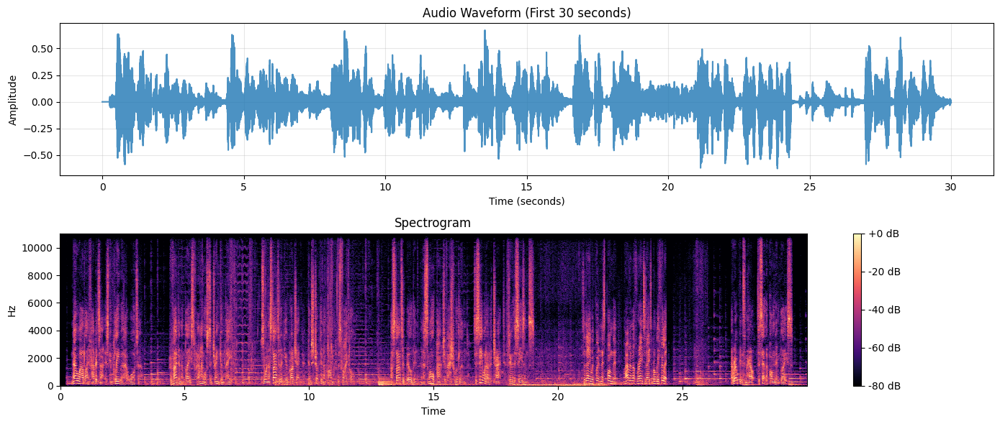

🎧 Audio sample rate: 22050 Hz
📏 Total samples (30s): 661,500


In [3]:
# Visualize the audio waveform
def visualize_audio(audio_path: str, duration: int = 30):
    """Visualize first 30 seconds of audio waveform"""
    
    print("📊 Loading audio for visualization...")
    y, sr = librosa.load(audio_path, duration=duration, sr=22050)
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 6))
    
    # Waveform
    axes[0].set_title('Audio Waveform (First 30 seconds)')
    axes[0].plot(np.linspace(0, duration, len(y)), y, alpha=0.8)
    axes[0].set_xlabel('Time (seconds)')
    axes[0].set_ylabel('Amplitude')
    axes[0].grid(True, alpha=0.3)
    
    # Spectrogram
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    img = librosa.display.specshow(D, y_axis='linear', x_axis='time', 
                                   sr=sr, ax=axes[1])
    axes[1].set_title('Spectrogram')
    plt.colorbar(img, ax=axes[1], format='%+2.0f dB')
    
    plt.tight_layout()
    plt.show()
    
    # Show audio player
    display(Audio(audio_path))
    print(f"🎧 Audio sample rate: {sr} Hz")
    print(f"📏 Total samples (30s): {len(y):,}")

visualize_audio(audio_file)

## Step 2: Speech-to-Text Transcription with Whisper

Now we'll use OpenAI's Whisper model to transcribe the audio. Whisper is a transformer-based model trained on 680,000 hours of multilingual data.

In [5]:
# Load Whisper model
print(f"🤖 Loading Whisper model on {device}...")
whisper_model = whisper.load_model("small")
print(f"✅ Model loaded! Parameters: {sum(p.numel() for p in whisper_model.parameters()):,}")

# Transcribe with timestamps
print("🎙️ Transcribing audio (this may take a minute)...")
result = whisper_model.transcribe(
    audio_file,
    language="en",
    verbose=False,
    word_timestamps=False  # We'll use segment timestamps
)

print(f"✅ Transcription complete!")
print(f"📝 Total segments: {len(result['segments'])}")
print(f"🌍 Detected language: {result.get('language', 'en')}")

🤖 Loading Whisper model on mps...
✅ Model loaded! Parameters: 240,582,912
🎙️ Transcribing audio (this may take a minute)...


100%|█████████▉| 48300/48518 [00:30<00:00, 1560.75frames/s]

✅ Transcription complete!
📝 Total segments: 81
🌍 Detected language: en


In [6]:
# Format and display segments
def format_timestamp(seconds: float) -> str:
    """Convert seconds to readable timestamp"""
    return str(timedelta(seconds=int(seconds)))

# Create a structured representation of segments
segments = []
for seg in result['segments']:
    segments.append({
        'id': seg['id'],
        'start': seg['start'],
        'end': seg['end'],
        'text': seg['text'].strip(),
        'duration': seg['end'] - seg['start']
    })

# Display first few segments
print("🎬 First 5 transcript segments:\n")
for i, seg in enumerate(segments[:5]):
    print(f"Segment {i+1} [{format_timestamp(seg['start'])} - {format_timestamp(seg['end'])}]")
    print(f"📝 {seg['text']}")
    print(f"⏱️ Duration: {seg['duration']:.1f} seconds\n")

# Show overall statistics
total_duration = segments[-1]['end'] if segments else 0
avg_segment_duration = np.mean([s['duration'] for s in segments])
print(f"📊 Statistics:")
print(f"  - Total duration: {format_timestamp(total_duration)}")
print(f"  - Average segment duration: {avg_segment_duration:.1f} seconds")
print(f"  - Total words: {sum(len(s['text'].split()) for s in segments):,}")

🎬 First 5 transcript segments:

Segment 1 [0:00:00 - 0:00:04]
📝 No wildlife habitat is complete without water,
⏱️ Duration: 4.0 seconds

Segment 2 [0:00:04 - 0:00:08]
📝 providing a place for animals to drink and bathe.
⏱️ Duration: 4.0 seconds

Segment 3 [0:00:08 - 0:00:13]
📝 So when I started a new project, constructing a pond was vital.
⏱️ Duration: 5.0 seconds

Segment 4 [0:00:13 - 0:00:16]
📝 I started building in a small patch of ash woodland
⏱️ Duration: 3.0 seconds

Segment 5 [0:00:16 - 0:00:20]
📝 to see what I'd attract through the seasons.
⏱️ Duration: 4.0 seconds

📊 Statistics:
  - Total duration: 0:07:39
  - Average segment duration: 3.6 seconds
  - Total words: 826


## Step 3: Text Embeddings & Vector Database

Now we'll convert our text segments into vector embeddings. These vectors capture the semantic meaning of text in a high-dimensional space.

In [7]:
# Initialize sentence transformer model
print("🧠 Loading sentence transformer model...")
text_encoder = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
    
print(f"✅ Model loaded!")
print(f"📐 Embedding dimension: {text_encoder.get_sentence_embedding_dimension()}")

🧠 Loading sentence transformer model...
✅ Model loaded!
📐 Embedding dimension: 384


In [18]:
# Generate embeddings for all segments
print("🔄 Generating embeddings for transcript segments...")

# Extract just the text from segments
segment_texts = [seg['text'] for seg in segments]

# Generate embeddings (batch processing for efficiency)
embeddings = text_encoder.encode(segment_texts, show_progress_bar=True)

print(f"✅ Generated {len(embeddings)} embeddings")
print(f"📊 Embedding shape: {embeddings.shape}")

# Show an example embedding
print("\n🔍 Example: First segment's embedding (first 10 dimensions):")
print(f"Text: '{segments[0]['text'][:50]}...'")
print(f"Embedding: {embeddings[0][:10]}")
print(f"\n📈 These {embeddings.shape[1]} numbers capture the semantic meaning of the text.")

🔄 Generating embeddings for transcript segments...


Batches:   0%|          | 0/3 [00:00<?, ?it/s]

✅ Generated 81 embeddings
📊 Embedding shape: (81, 384)

🔍 Example: First segment's embedding (first 10 dimensions):
Text: 'No wildlife habitat is complete without water,...'
Embedding: [ 0.09349316  0.06699594  0.01872621  0.01632554  0.07074153 -0.05591662
 -0.06699276 -0.10329412 -0.01353564  0.03613507]

📈 These 384 numbers capture the semantic meaning of the text.


In [9]:
# Initialize ChromaDB
print("🗄️ Setting up ChromaDB vector database...")

# Create a persistent client
chroma_client = chromadb.Client()

# Delete collection if it exists (for clean runs)
try:
    chroma_client.delete_collection("wildlife_transcripts")
except:
    pass

# Create collection with embedding function
collection = chroma_client.create_collection(
    name="wildlife_transcripts",
    metadata={"hnsw:space": "cosine"}  # Use cosine similarity
)

# Prepare data for ChromaDB
ids = [f"seg_{i}" for i in range(len(segments))]
metadatas = [
    {
        "start": seg['start'],
        "end": seg['end'],
        "duration": seg['duration'],
        "segment_id": seg['id']
    }
    for seg in segments
]

# Add to collection
collection.add(
    embeddings=embeddings.tolist(),
    documents=segment_texts,
    metadatas=metadatas,
    ids=ids
)

print(f"✅ Indexed {collection.count()} segments in vector database!")
print(f"🎯 Ready for semantic search!")

🗄️ Setting up ChromaDB vector database...
✅ Indexed 81 segments in vector database!
🎯 Ready for semantic search!


## Step 4: Search Methods Implementation

Let's implement three different search methods to understand their differences.

In [12]:
def keyword_search(query: str, segments: List[Dict], top_k: int = 5) -> List[Dict]:
    """Simple keyword-based search"""
    query_lower = query.lower()
    results = []
    
    for seg in segments:
        text_lower = seg['text'].lower()
        if query_lower in text_lower:
            # Calculate a simple relevance score based on frequency
            score = text_lower.count(query_lower) / len(text_lower.split())
            results.append({
                **seg,
                'score': score,
                'method': 'keyword'
            })
    
    # Sort by score and return top_k
    results.sort(key=lambda x: x['score'], reverse=True)
    return results[:top_k]

def semantic_search(query: str, collection, text_encoder, top_k: int = 5) -> List[Dict]:
    """Semantic similarity search using embeddings"""
    # Encode the query
    query_embedding = text_encoder.encode([query])
    
    # Search in ChromaDB
    results = collection.query(
        query_embeddings=query_embedding.tolist(),
        n_results=top_k
    )
    
    # Format results
    formatted_results = []
    for i in range(len(results['ids'][0])):
        formatted_results.append({
            'text': results['documents'][0][i],
            'start': results['metadatas'][0][i]['start'],
            'end': results['metadatas'][0][i]['end'],
            'score': 1 - results['distances'][0][i],  # Convert distance to similarity
            'method': 'semantic'
        })
    
    return formatted_results

print("✅ Search functions defined!")

✅ Search functions defined!


## Step 5: Search Methods Comparison

Let's compare how different search methods perform on the same queries.

In [13]:
def compare_search_methods(query: str):
    """Compare all search methods for a given query"""
    print(f"\n🔍 QUERY: '{query}'\n")
    print("=" * 80)
    
    # Keyword search
    print("\n📝 KEYWORD SEARCH:")
    keyword_results = keyword_search(query, segments, top_k=3)
    if keyword_results:
        for i, result in enumerate(keyword_results, 1):
            print(f"  {i}. [{format_timestamp(result['start'])}] {result['text'][:100]}...")
            print(f"     Score: {result['score']:.4f}")
    else:
        print("  No exact matches found")
    
    # Semantic search
    print("\n🧠 SEMANTIC SEARCH:")
    semantic_results = semantic_search(query, collection, text_encoder, top_k=3)
    for i, result in enumerate(semantic_results, 1):
        print(f"  {i}. [{format_timestamp(result['start'])}] {result['text'][:100]}...")
        print(f"     Similarity: {result['score']:.4f}")
    
    return keyword_results, semantic_results

# Test with different queries
queries = [
    "pond",  # Direct keyword
    "water habitat for animals",  # Semantic concept
    "badger drinking water",  # Specific event
]

all_results = {}
for q in queries:
    keyword_res, semantic_res = compare_search_methods(q)
    all_results[q] = {'keyword': keyword_res, 'semantic': semantic_res}


🔍 QUERY: 'pond'


📝 KEYWORD SEARCH:
  1. [0:00:20] Today we're putting this pond in,...
     Score: 0.1667
  2. [0:02:34] A fox walked across the frozen pond....
     Score: 0.1429
  3. [0:01:40] The pond is underneath here up at Ashwood...
     Score: 0.1250

🧠 SEMANTIC SEARCH:
  1. [0:00:20] Today we're putting this pond in,...
     Similarity: 0.7256
  2. [0:01:40] The pond is underneath here up at Ashwood...
     Similarity: 0.6680
  3. [0:00:08] So when I started a new project, constructing a pond was vital....
     Similarity: 0.6482

🔍 QUERY: 'water habitat for animals'


📝 KEYWORD SEARCH:
  No exact matches found

🧠 SEMANTIC SEARCH:
  1. [0:00:04] providing a place for animals to drink and bathe....
     Similarity: 0.6736
  2. [0:01:59] Other animals soon found their way to this new watering hole....
     Similarity: 0.5903
  3. [0:00:00] No wildlife habitat is complete without water,...
     Similarity: 0.5662

🔍 QUERY: 'badger drinking water'


📝 KEYWORD SEARCH:
  No exact 

## Step 6: Visual Search

Now let's extract frames from the video and enable visual search using SIGLIP.

📹 Getting video information...
📊 Original video frame rate: 25.00 fps
📐 Video resolution: 640x360
✅ Found 243 existing frames

📸 Sample frames from the video:


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


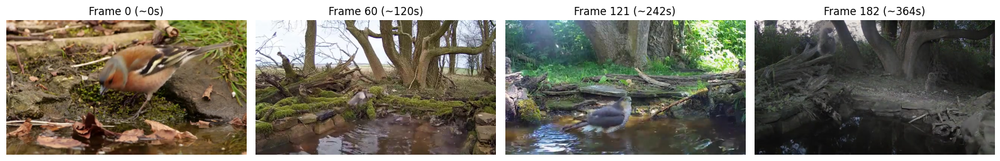

In [14]:
# Extract frames from video
def extract_frames(video_path: str, output_dir: Path, fps: float = 0.5):
    """Extract frames from video at specified FPS"""
    frames_dir = output_dir / "frames"
    frames_dir.mkdir(exist_ok=True)
    
    # First, get video information including frame rate
    print("📹 Getting video information...")
    probe_cmd = [
        'ffprobe', '-v', 'error',
        '-select_streams', 'v:0',
        '-show_entries', 'stream=r_frame_rate,width,height,nb_frames',
        '-of', 'json', str(video_path)
    ]
    
    try:
        probe_result = subprocess.run(probe_cmd, capture_output=True, text=True)
        import json
        video_info = json.loads(probe_result.stdout)
        if video_info.get('streams'):
            frame_rate_str = video_info['streams'][0].get('r_frame_rate', 'Unknown')
            # Frame rate is returned as fraction (e.g., "30/1")
            if '/' in frame_rate_str:
                num, denom = frame_rate_str.split('/')
                original_fps = float(num) / float(denom)
                print(f"📊 Original video frame rate: {original_fps:.2f} fps")
            width = video_info['streams'][0].get('width', 'Unknown')
            height = video_info['streams'][0].get('height', 'Unknown')
            print(f"📐 Video resolution: {width}x{height}")
    except Exception as e:
        print(f"⚠️ Could not get video info: {e}")
    
    # Check if frames already extracted
    existing_frames = list(frames_dir.glob("*.jpg"))
    if len(existing_frames) > 10:
        print(f"✅ Found {len(existing_frames)} existing frames")
        return sorted(existing_frames)
    
    print(f"🎬 Extracting frames at {fps} FPS (1 frame every {1/fps:.1f} seconds)...")
    
    # Use ffmpeg to extract frames
    cmd = [
        'ffmpeg', '-i', video_path,
        '-vf', f'fps={fps}',
        '-q:v', '2',
        str(frames_dir / 'frame_%04d.jpg'),
        '-y'
    ]
    
    result = subprocess.run(cmd, capture_output=True, text=True)
    
    frames = sorted(frames_dir.glob("*.jpg"))
    print(f"✅ Extracted {len(frames)} frames")
    print(f"📉 Reduction ratio: Taking 1 frame out of every ~{int(original_fps/fps)} original frames")
    return frames

# Extract frames (1 frame every 2 seconds)
frames = extract_frames(video_file, WORK_DIR, fps=0.5)

# Display sample frames
print("\n📸 Sample frames from the video:")
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
sample_indices = [0, len(frames)//4, len(frames)//2, 3*len(frames)//4]

for idx, ax in enumerate(axes):
    if sample_indices[idx] < len(frames):
        img = Image.open(frames[sample_indices[idx]])
        ax.imshow(img)
        ax.set_title(f"Frame {sample_indices[idx]} (~{sample_indices[idx]*2}s)")
        ax.axis('off')

plt.tight_layout()
plt.show()

In [30]:
print("🎨 Loading SIGLIP2 model for multimodal search...")

from transformers import AutoProcessor, AutoModel

model_name = "google/siglip2-base-patch16-384"
print(f"📦 Loading model: {model_name}")

siglip_processor = AutoProcessor.from_pretrained(model_name)
siglip_model = AutoModel.from_pretrained(model_name)

print(f"✅ SIGLIP2 model loaded")
print(f"📐 Embedding dimension: {siglip_model.config.vision_config.hidden_size}")

🎨 Loading SIGLIP2 model for multimodal search...
📦 Loading model: google/siglip2-base-patch16-384


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

✅ SIGLIP2 model loaded
📐 Embedding dimension: 768


In [41]:
# Generate visual embeddings for frames
def encode_images(images: List[Path], batch_size: int = 8):
    """Encode images using SIGLIP2"""
    all_embeddings = []
    
    for i in range(0, len(images), batch_size):
        batch_paths = images[i:i+batch_size]
        batch_images = [Image.open(p).convert('RGB') for p in batch_paths]
        
        # Process images!
        inputs = siglip_processor(images=batch_images, return_tensors="pt")
        
        # Get embeddings
        with torch.no_grad():
            outputs = siglip_model.get_image_features(**inputs)
            embeddings = outputs / outputs.norm(dim=-1, keepdim=True)
            all_embeddings.append(embeddings.cpu().numpy())
    
    return np.vstack(all_embeddings)

# Encode sample frames (limit to 200 for good coverage)
sample_frames = frames[:200]
print(f"🔄 Encoding {len(sample_frames)} frames...")

visual_embeddings = encode_images(sample_frames, batch_size=8)
print(f"✅ Generated visual embeddings: {visual_embeddings.shape}")

# Create ChromaDB collection for visual embeddings
print("\n🗄️ Setting up ChromaDB for visual search...")

# Delete visual collection if it exists (for clean runs)
try:
    chroma_client.delete_collection("video_frames")
except:
    pass

# Create visual collection
visual_collection = chroma_client.create_collection(
    name="video_frames",
    metadata={"hnsw:space": "cosine"}  # Use cosine similarity
)

# Prepare data for ChromaDB
frame_ids = [f"frame_{i}" for i in range(len(sample_frames))]
frame_documents = [f"Frame at {i*2}s showing video content" for i in range(len(sample_frames))]
frame_metadatas = [
    {
        "frame_path": str(sample_frames[i]),
        "frame_number": i,
        "timestamp": i * 2,  # Since we extract at 0.5 fps
    }
    for i in range(len(sample_frames))
]

# Add frame embeddings to collection
visual_collection.add(
    embeddings=visual_embeddings.tolist(),
    documents=frame_documents,
    metadatas=frame_metadatas,
    ids=frame_ids
)

print(f"✅ Indexed {visual_collection.count()} frames in vector database.")

# FIXED: Encode text with SIGLIP using the same optimizations as the app
def encode_text_siglip(texts: List[str]):
    """Encode text using SIGLIP with optimizations for visual search"""
    formatted_texts = []
    for text in texts:
        # Convert to lowercase as recommended for SIGLIP2
        text_lower = text.lower()
        # Use prompt template for better visual search results
        formatted_text = f"This is a photo of {text_lower}."
        formatted_texts.append(formatted_text)
    
    # Use specific padding parameters for SIGLIP2 text
    inputs = siglip_processor(
        text=formatted_texts, 
        return_tensors="pt", 
        padding="max_length",
        max_length=64
    )
    
    with torch.no_grad():
        outputs = siglip_model.get_text_features(**inputs)
        embeddings = outputs / outputs.norm(dim=-1, keepdim=True)
    
    return embeddings.cpu().numpy()

# Test that text and image embeddings are in same space
test_text = ["a pond with water"]
text_embedding_siglip = encode_text_siglip(test_text)
print(f"\n🔍 Text embedding shape: {text_embedding_siglip.shape}")
print(f"🎨 Image embedding shape: {visual_embeddings[0:1].shape}")
print(f"✅ Same dimension. Text and images map to the same {text_embedding_siglip.shape[1]}-dimensional space")

🔄 Encoding 200 frames...
✅ Generated visual embeddings: (200, 768)

🗄️ Setting up ChromaDB for visual search...
✅ Indexed 200 frames in vector database.

🔍 Text embedding shape: (1, 768)
🎨 Image embedding shape: (1, 768)
✅ Same dimension. Text and images map to the same 768-dimensional space


🎨 VISUAL SEARCH RESULTS


🔍 Query: 'badger in nature'


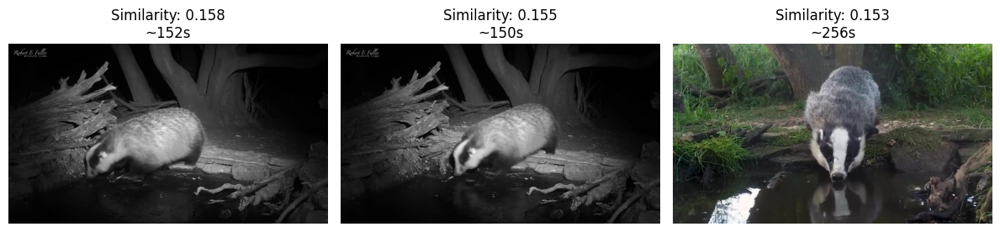


🔍 Query: 'bird near water'


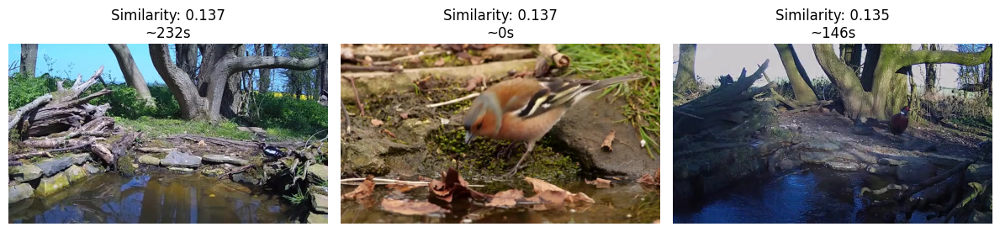


🔍 Query: 'birds at the pond'


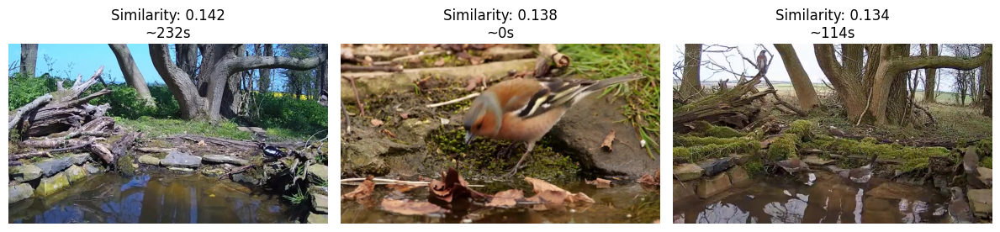


🔍 Query: 'owl in tree'


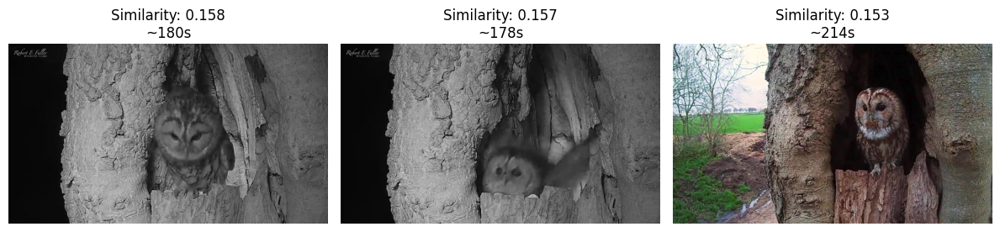


🔍 Query: 'pond construction'


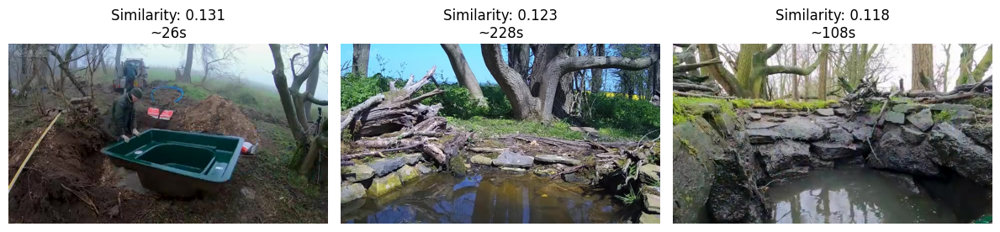

In [42]:
# Visual search function using ChromaDB
def visual_search_db(query: str, collection, top_k: int = 3):
    """Search for images using text query with ChromaDB"""
    
    # Encode query using SIGLIP with optimizations
    query_embedding = encode_text_siglip([query])
    
    # Search in ChromaDB - convert numpy array to list properly
    results = collection.query(
        query_embeddings=query_embedding.tolist(),  # Convert numpy array to list
        n_results=top_k
    )
    
    # Format results
    formatted_results = []
    for i in range(len(results['ids'][0])):
        metadata = results['metadatas'][0][i]
        formatted_results.append({
            'frame': Path(metadata['frame_path']),
            'frame_number': metadata['frame_number'],
            'timestamp': metadata['timestamp'],
            'similarity': 1 - results['distances'][0][i],  # Convert distance to similarity
            'method': 'visual'
        })
    
    return formatted_results

# Test visual search with ChromaDB
visual_queries = [
    "badger in nature",
    "bird near water", 
    "birds at the pond", 
    "owl in tree",
    "pond construction"
]

print("🎨 VISUAL SEARCH RESULTS\n")
print("=" * 80)

for query in visual_queries:
    print(f"\n🔍 Query: '{query}'")
    results = visual_search_db(query, visual_collection, top_k=3)
    
    # Display results
    fig, axes = plt.subplots(1, len(results), figsize=(12, 4))
    if len(results) == 1:
        axes = [axes]
    
    for idx, (ax, result) in enumerate(zip(axes, results)):
        img = Image.open(result['frame'])
        ax.imshow(img)
        ax.set_title(f"Similarity: {result['similarity']:.3f}\n~{result['timestamp']}s")
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()